# Quran Optical Character Recognition (OCR)

The Quran image data used in this notebook were downloaded from http://quran.ksu.edu.sa/ayat/images.ayt. It is actually an archive file that can be easily extracted.

## PyTesseract (Failed)

The code below was taken from https://nanonets.com/blog/ocr-with-tesseract/. Unfortunately, this didn't work properly (see https://github.com/tesseract-ocr/tesseract/issues/657); need more robust approaches for handwritten arabic with diacritics.

In [15]:
# import cv2
# import pytesseract
# from pytesseract import Output


# image = cv2.imread('dataset/quran-images/3.png')
# d = pytesseract.image_to_data(image, 'ara', output_type=Output.DICT)
# print(d.keys())

In [16]:
# n_boxes = len(d['text'])
# for i in range(n_boxes):
#     if int(d['conf'][i]) > 60:
#         (x, y, w, h) = (d['left'][i], d['top'][i], d['width'][i], d['height'][i])
#         image = cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

# cv2.imshow('Result', image)
# cv2.waitKey(0)

## ArabicOCR (Failed)

In [17]:
# import easyocr


# reader = easyocr.Reader(['ar'])
# result = reader.readtext('dataset/quran-images/3.png')

In [18]:
# result2 = reader.readtext('dataset/quran-images/604.png')

## Manual Metadata Extraction

The functions below were taken from https://www.sicara.ai/blog/object-detection-template-matching

In [19]:
import cv2
import numpy as np
from matplotlib import pyplot as plt


TEMPLATE_MATCHING_THRESHOLD = 0.5
NMS_THRESHOLD = 0.2


class Template:
    """
    A class defining a template
    """
    def __init__(self, image_path, label, color, matching_threshold=TEMPLATE_MATCHING_THRESHOLD):
        """
        Args:
            image_path (str): path of the template image path
            label (str): the label corresponding to the template
            color (List[int]): the color associated with the label (to plot detections)
            matching_threshold (float): the minimum similarity score to consider an object is detected by template
                matching
        """
        self.image_path = image_path
        self.label = label
        self.color = color
        self.template = cv2.imread(image_path)
        self.template_height, self.template_width = self.template.shape[:2]
        self.matching_threshold = matching_threshold


def compute_iou(a, b, epsilon=1e-5, minimum=False):
    """ Given two boxes `a` and `b` defined as a list of four numbers:
            [x1,y1,x2,y2]
        where:
            x1,y1 represent the upper left corner
            x2,y2 represent the lower right corner
        It returns the Intersect of Union score for these two boxes.

    Args:
        a:          (list of 4 numbers) [x1,y1,x2,y2]
        b:          (list of 4 numbers) [x1,y1,x2,y2]
        epsilon:    (float) Small value to prevent division by zero
        minimum: (boolean) Use the minimum area of box `a` or `b` as the divisor

    Returns:
        (float) The Intersect of Union score.
    """
    # COORDINATES OF THE INTERSECTION BOX
    x1 = max(a[0], b[0])
    y1 = max(a[1], b[1])
    x2 = min(a[2], b[2])
    y2 = min(a[3], b[3])

    # AREA OF OVERLAP - Area where the boxes intersect
    width = (x2 - x1)
    height = (y2 - y1)
    # handle case where there is NO overlap
    if (width < 0) or (height < 0):
        return 0.0
    area_overlap = width * height

    # COMBINED AREA
    area_a = (a[2] - a[0]) * (a[3] - a[1])
    area_b = (b[2] - b[0]) * (b[3] - b[1])

    # RATIO OF AREA OF OVERLAP OVER SMALLEST AREA
    if minimum:
        return area_overlap / min(area_a, area_b)

    # RATIO OF AREA OF OVERLAP OVER COMBINED AREA
    area_combined = area_a + area_b - area_overlap
    return area_overlap / (area_combined + epsilon)


def non_max_suppression(
    objects,
    non_max_suppression_threshold=0.5,
    score_key="MATCH_VALUE",
):
    """
    Filter objects overlapping with IoU over threshold by keeping only the one with maximum score.
    Args:
        objects (List[dict]): a list of objects dictionaries, with:
            {score_key} (float): the object score
            {top_left_x} (float): the top-left x-axis coordinate of the object bounding box
            {top_left_y} (float): the top-left y-axis coordinate of the object bounding box
            {bottom_right_x} (float): the bottom-right x-axis coordinate of the object bounding box
            {bottom_right_y} (float): the bottom-right y-axis coordinate of the object bounding box
        non_max_suppression_threshold (float): the minimum IoU value used to filter overlapping boxes when
            conducting non max suppression.
        score_key (str): score key in objects dicts
    Returns:
        List[dict]: the filtered list of dictionaries.
    """
    sorted_objects = sorted(objects, key=lambda obj: obj[score_key], reverse=True)
    filtered_objects = []
    for object_ in sorted_objects:
        overlap_found = False
        for filtered_object in filtered_objects:
            a = [
                object_['TOP_LEFT_X'],
                object_['TOP_LEFT_Y'],
                object_['BOTTOM_RIGHT_X'],
                object_['BOTTOM_RIGHT_Y'],
            ]
            b = [
                filtered_object['TOP_LEFT_X'],
                filtered_object['TOP_LEFT_Y'],
                filtered_object['BOTTOM_RIGHT_X'],
                filtered_object['BOTTOM_RIGHT_Y'],
            ]
            iou = compute_iou(a, b)
            if iou > non_max_suppression_threshold:
                overlap_found = True
                break
        if not overlap_found:
            filtered_objects.append(object_)
    return filtered_objects


def detect(image, templates):
    detections = []
    for template in templates:
        for scale in [0.8, 1.0]:
            template_img = template.template.copy()
            if scale != 1.0:
                template_img = cv2.resize(
                    template_img, (int(template_img.shape[1] * scale),
                    int(template_img.shape[0] * scale))
                )
            for orientation in [-2, 0, 2]:
                template_img_ = template_img.copy()
                if orientation != 0:
                    h, w = template_img_.shape[:2]
                    image_center = tuple(np.array([w, h]) / 2)
                    rotation_matrix = cv2.getRotationMatrix2D(image_center, orientation, 1.0)
                    template_img_ = cv2.warpAffine(
                        template_img_, rotation_matrix, (w, h),
                        flags=cv2.INTER_LINEAR
                    )
                    # plt.imshow(template_img_)
                    # plt.show()

                template_matching = cv2.matchTemplate(
                    template_img_, image, cv2.TM_CCOEFF_NORMED
                )

                match_locations = np.where(template_matching >= template.matching_threshold)

                for (x, y) in zip(match_locations[1], match_locations[0]):
                    match = {
                        "TOP_LEFT_X": x,
                        "TOP_LEFT_Y": y,
                        "BOTTOM_RIGHT_X": x + template.template_width,
                        "BOTTOM_RIGHT_Y": y + template.template_height,
                        "MATCH_VALUE": template_matching[y, x],
                        "LABEL": template.label,
                        "COLOR": template.color
                    }
                    detections.append(match)

    detections = non_max_suppression(detections, non_max_suppression_threshold=NMS_THRESHOLD)

    # image_with_detections = image.copy()
    # for detection in detections:
    #     cv2.rectangle(
    #         image_with_detections,
    #         (detection["TOP_LEFT_X"], detection["TOP_LEFT_Y"]),
    #         (detection["BOTTOM_RIGHT_X"], detection["BOTTOM_RIGHT_Y"]),
    #         detection["COLOR"],
    #         1,
    #     )
    #     cv2.putText(
    #         image_with_detections,
    #         f"{detection['LABEL']} - {detection['MATCH_VALUE']}",
    #         (detection["TOP_LEFT_X"] + 2, detection["TOP_LEFT_Y"] + 20),
    #         cv2.FONT_HERSHEY_SIMPLEX,
    #         0.5,
    #         detection["COLOR"],
    #         1,
    #         cv2.LINE_AA,
    #     )

    # cv2.imshow('Result', image_with_detections)
    # cv2.waitKey(0)

    return detections

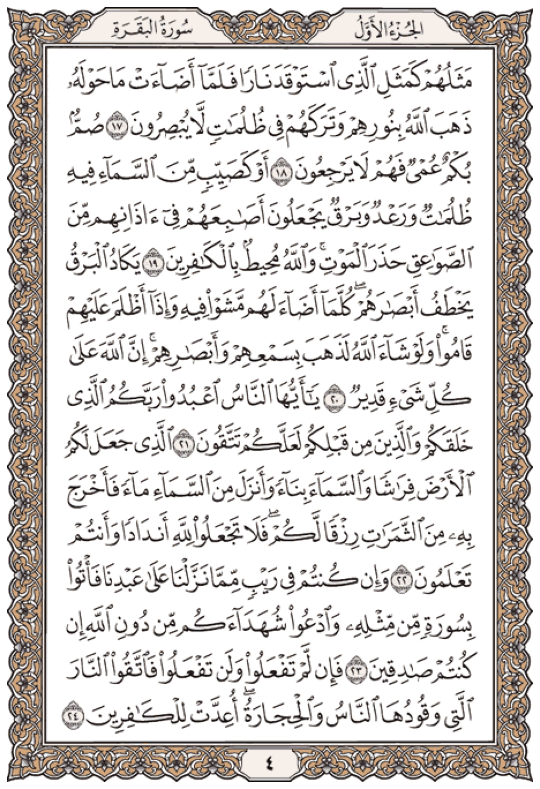

In [20]:
import matplotlib
from os import path


# Constants
DPI_DISPLAY = 96
PAGE_BORDER = 42

IMAGE_DIR = './dataset/quran-images/'
SURAH_MARKER_FILENAMES = ['sura-name-marker.png']
BISMILLAH_MARKER_FILENAMES = ['bismilla-marker.png', 'bismilla-marker-2.png']
AYAH_MARKER_FILENAMES = ['aya-end-marker.png']

image_sample = cv2.imread(path.join(IMAGE_DIR, '4.png'))  # the good cases are `3.png`, `299.png`, `347.png`, `434.png`, and `602.png`
PAGE_HEIGHT, PAGE_WIDTH, _ = image_sample.shape

# Matplotlib display settings
rc = {'figure.figsize': (PAGE_HEIGHT/(DPI_DISPLAY/3), PAGE_WIDTH/(DPI_DISPLAY/3)),
      'axes.spines.left': False,
      'axes.spines.right': False,
      'axes.spines.bottom': False,
      'axes.spines.top': False,
      'xtick.bottom': False,
      'xtick.labelbottom': False,
      'ytick.labelleft': False,
      'ytick.left': False}
plt.rcParams.update(rc)

# for validation purposes only
image = cv2.cvtColor(image_sample, cv2.COLOR_BGR2RGB)
plt.imshow(image)
plt.show()

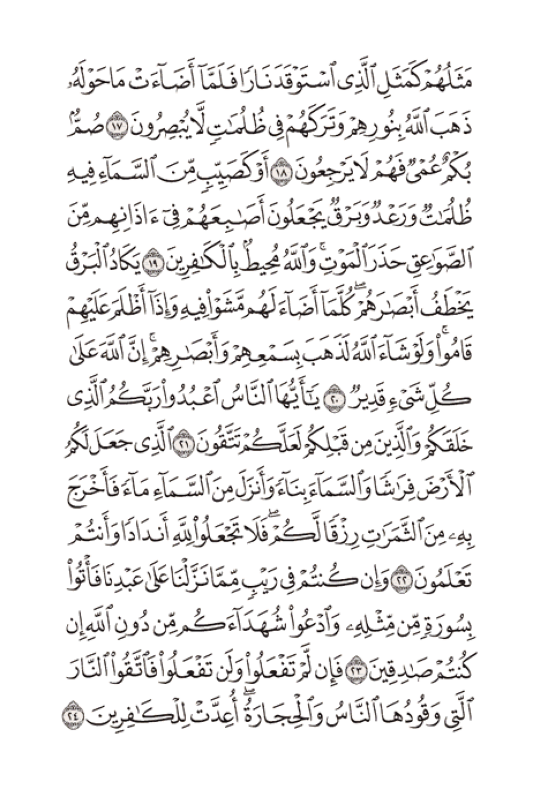

In [21]:
# This is a naive method
# to remove page border
# for page 3-604 only
image_wo_border = 255 * np.ones((PAGE_HEIGHT, PAGE_WIDTH, 3), np.uint8)
image_wo_border[
    PAGE_BORDER:(PAGE_HEIGHT-PAGE_BORDER),
    PAGE_BORDER:(PAGE_WIDTH-PAGE_BORDER)
] = image[
    PAGE_BORDER:(PAGE_HEIGHT-PAGE_BORDER),
    PAGE_BORDER:(PAGE_WIDTH-PAGE_BORDER)
]

plt.imshow(image_wo_border)
plt.show()

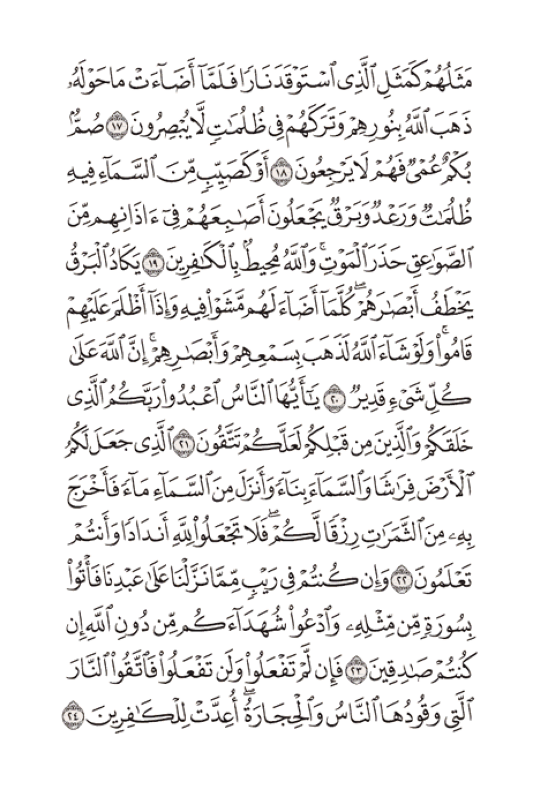

In [22]:
# Find surah, bismillah, and ayah's end marker glyphs
templates = []
for filename in SURAH_MARKER_FILENAMES:
    templates.append(Template(image_path=path.join(IMAGE_DIR, filename), label="surah", color=(255, 0, 0)))
for filename in AYAH_MARKER_FILENAMES:
    templates.append(Template(image_path=path.join(IMAGE_DIR, filename), label="ayah", color=(0, 0, 255)))
for filename in BISMILLAH_MARKER_FILENAMES:
    templates.append(Template(image_path=path.join(IMAGE_DIR, filename), label="bismillah", color=(0, 255, 0)))
bbox_ids = detect(image, templates)

image_wo_ids = image_wo_border.copy()
for glyph in bbox_ids:
    if glyph["LABEL"] == "ayah":
        continue
    image_wo_ids[
        glyph["TOP_LEFT_Y"]:glyph["BOTTOM_RIGHT_Y"],
        glyph["TOP_LEFT_X"]:glyph["BOTTOM_RIGHT_X"]
    ] = (255, 255, 255)

plt.imshow(image_wo_ids)
plt.show()

In [23]:
# # This is a more clever (but experimental) method
# # to remove page border
# # for page 3 and above
# image_gray = cv2.cvtColor(image_wo_ids, cv2.COLOR_BGR2GRAY)
# image_thresh = cv2.threshold(image_gray, 1, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

# kernel_dilation = np.ones((5, 5), np.uint8)
# image_dilation = cv2.dilate(image_thresh, kernel_dilation, iterations=1)

# # plt.imshow(image_dilation)
# # plt.show()

# for scale in [0.25, 0.05]:  # sliding window
#     cv2.floodFill(image_dilation, None, (int(PAGE_HEIGHT * scale), int(PAGE_WIDTH / 2)), 0)

# # FIXME: the page number sometimes isn't excluded
# plt.imshow(image_dilation)
# plt.show()

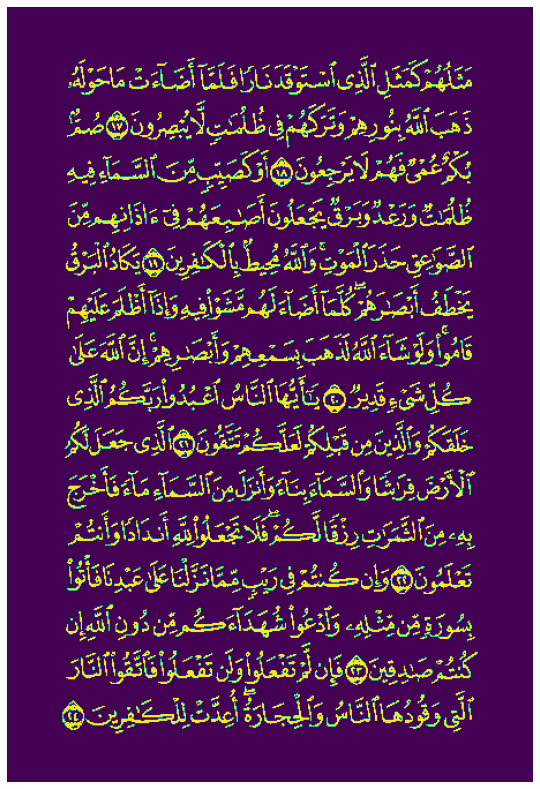

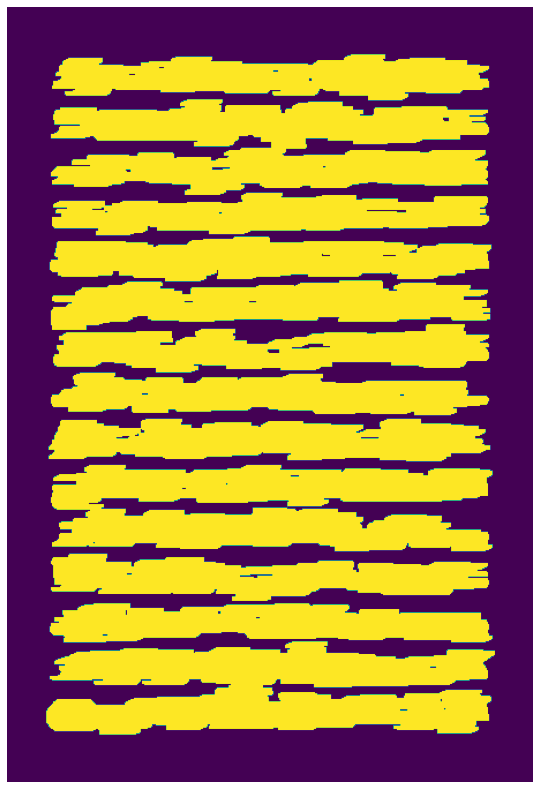

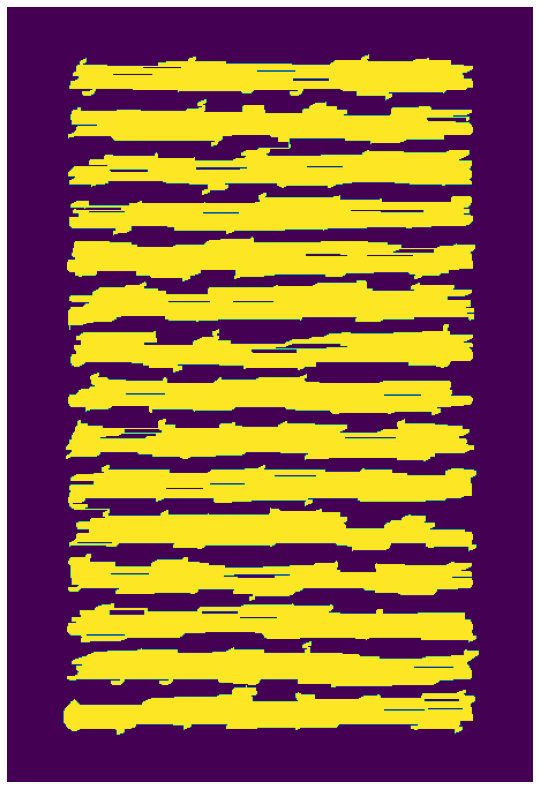

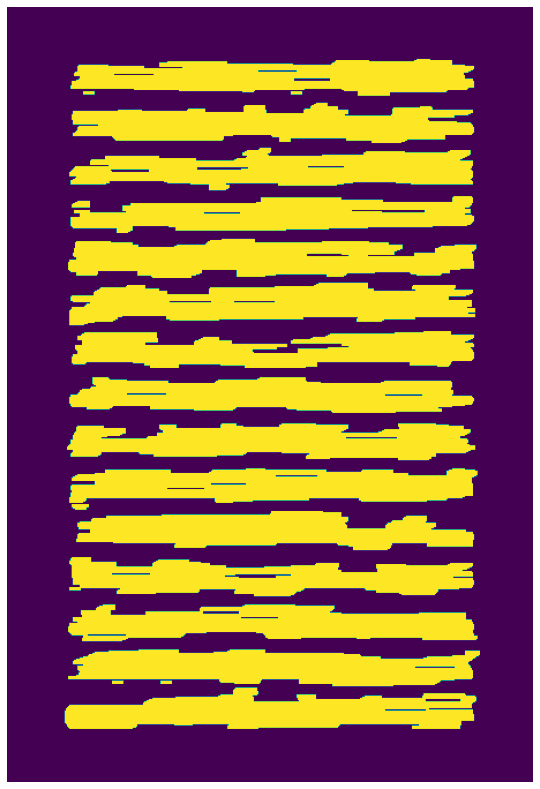

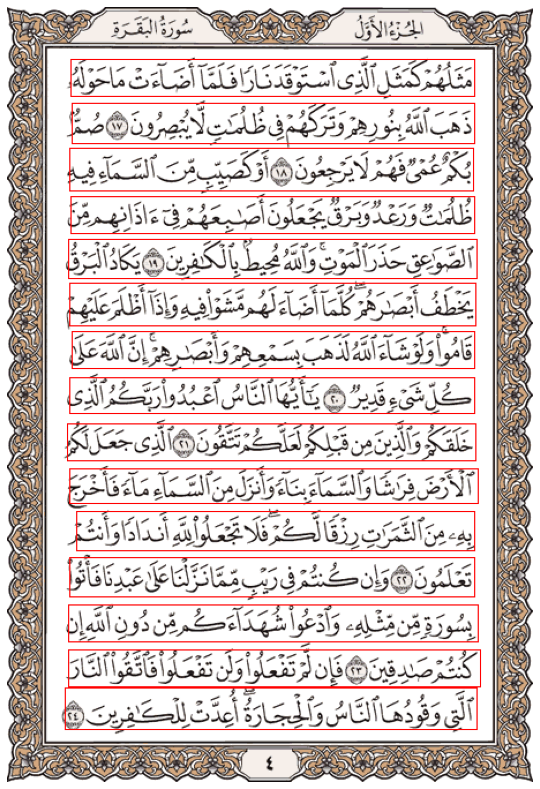

In [24]:
# This is the first approach
# to segment lines
image_gray = cv2.cvtColor(image_wo_ids, cv2.COLOR_BGR2GRAY)
image_thresh = cv2.threshold(image_gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

plt.imshow(image_thresh)
plt.show()

# kernel = np.ones((3, 50), np.uint8)
kernel_dilation = np.ones((3, 30), np.uint8)
image_dilation = cv2.dilate(image_thresh, kernel_dilation, iterations=1)

plt.imshow(image_dilation)
plt.show()

# kernel = np.ones((2, 90), np.uint8)
kernel_erosion = np.ones((1, 30), np.uint8)
image_erosion = cv2.erode(image_dilation, kernel_erosion, iterations=1)

plt.imshow(image_erosion)
plt.show()

kernel_opening = np.ones((3, 10), np.uint8)
image_opening = cv2.morphologyEx(image_erosion, cv2.MORPH_OPEN, kernel_opening)

plt.imshow(image_opening)
plt.show()

bbox_lines = cv2.findContours(image_opening, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
bbox_lines = bbox_lines[0] if len(bbox_lines) == 2 else bbox_lines[1]

image_with_contours = image.copy()
bbox_lines_ = []
for bbox in bbox_lines:
    x, y, w, h = cv2.boundingRect(bbox)
    if h < (PAGE_HEIGHT * 0.025):
        continue
    match = {
        "TOP_LEFT_X": x,
        "TOP_LEFT_Y": y,
        "BOTTOM_RIGHT_X": x + w,
        "BOTTOM_RIGHT_Y": y + h,
        "LABEL": "line",
        "COLOR": (0, 255, 255)
    }
    bbox_lines_.append(match)
    cv2.rectangle(image_with_contours, (x, y), (x+w, y+h), (255, 0, 0), 1)

plt.imshow(image_with_contours)
plt.show()

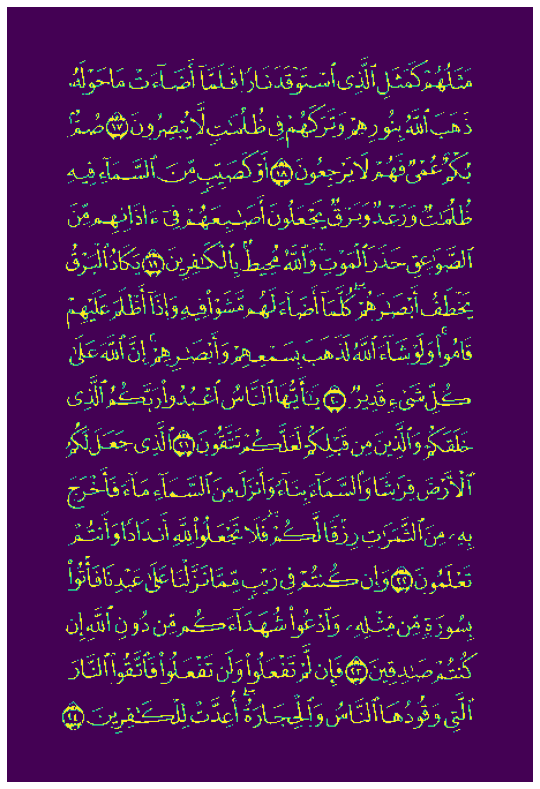

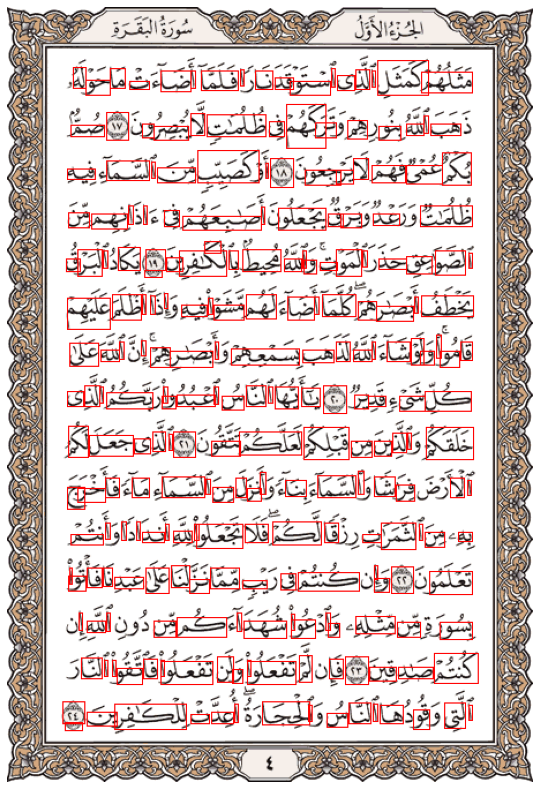

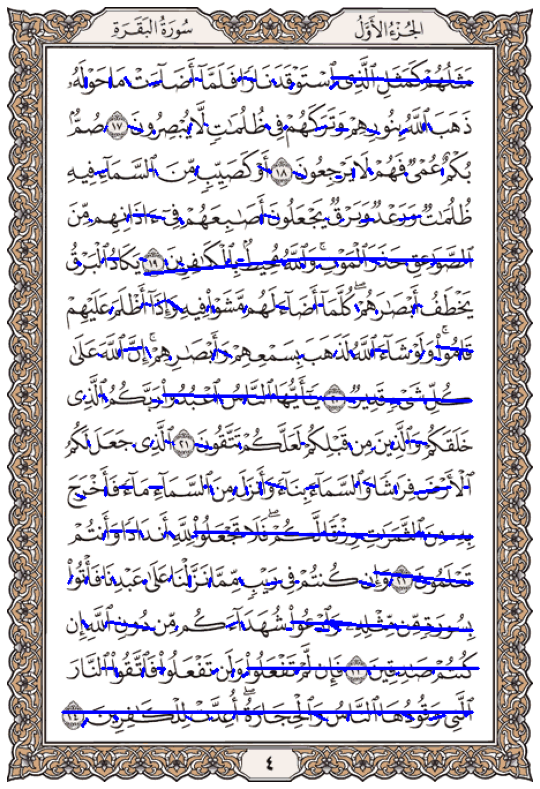

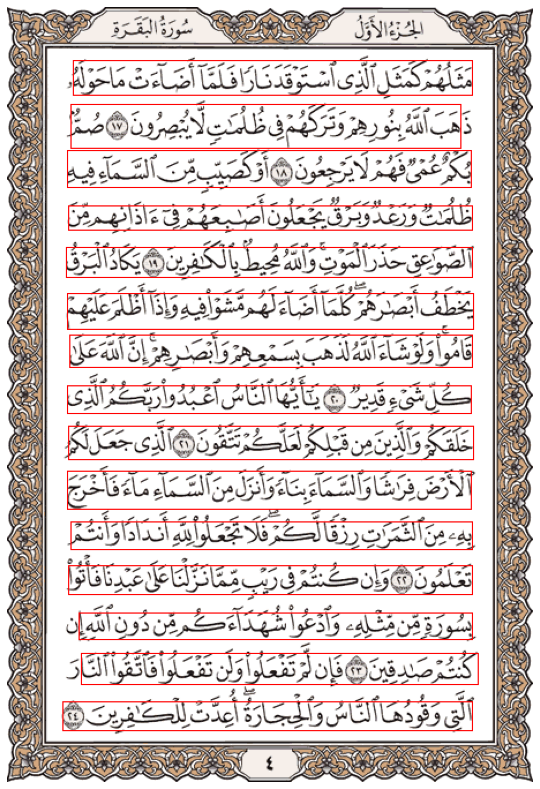

In [25]:
import math
import statistics as stat


# This is the second approach
# to segment lines
image_gray = cv2.cvtColor(image_wo_ids, cv2.COLOR_BGR2GRAY)
image_thresh = cv2.threshold(image_gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

# plt.imshow(image_thresh)
# plt.show()

kernel_erosion = np.ones((2, 1), np.uint8)
image_erosion = cv2.erode(image_thresh, kernel_erosion)

plt.imshow(image_erosion)
plt.show()

bbox_glyphs = cv2.findContours(image_erosion, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
bbox_glyphs = bbox_glyphs[0] if len(bbox_glyphs) == 2 else bbox_glyphs[1]

image_with_contours = image.copy()
nodes = []
heights = []
for bbox in bbox_glyphs:
    x, y, w, h = cv2.boundingRect(bbox)
    # TODO: do not hard code this
    if w < 12 and h < 12:  # remove all possible diacritics (small glyphs)
                           # we don't need all the nodes in each lines
                           # instead only a few samples
        continue
    nodes.append({
        'TOP_LEFT_X': x,
        'TOP_LEFT_Y': y,
        'BOTTOM_RIGHT_X': x + w,
        'BOTTOM_RIGHT_Y': y + h,
        'HEAD': (x, y + h // 2),
        'TAIL': (x + w, y + h // 2),
        'IS_VISITED': False
    })
    heights.append(h)
    cv2.rectangle(image_with_contours, (x, y), (x+w, y+h), (255, 0, 0), 1)
    # cv2.circle(image_with_contours, nodes[-1]['TAIL'] - nodes[-1]['HEAD'], 1, (0, 0, 255), 2)
    # cv2.line(image_with_contours, nodes[-1]['HEAD'], nodes[-1]['TAIL'], (255, 0, 255), 1)

    # rect = cv2.minAreaRect(bbox)
    # box = np.int0(cv2.boxPoints(rect))
    # cv2.drawContours(image_with_contours, [box], 0, (0, 0, 255), 1)

plt.imshow(image_with_contours)
plt.show()

nodes.sort(key=lambda x: x['TAIL'][0])
len_nodes = len(nodes)
# FIXME: using median heights isn't cannot be accounted for
# in knowing whether two nodes are on separate lines
med_heights = stat.median(heights)

distances = [[0 for _ in range(len_nodes)] for _ in range(len_nodes)]
for idx_source in range(len_nodes):
    pt_source = nodes[idx_source]
    for idx_target in range(idx_source + 1, len_nodes):
        pt_target = nodes[idx_target]
        distances[idx_source][idx_target] = math.dist(pt_target['HEAD'], pt_source['TAIL'])
        distances[idx_target][idx_source] = math.dist(pt_source['HEAD'], pt_target['TAIL'])

# Find all connected components
lines = []  # a list of node's index list
for idx_source in range(len_nodes):
    if nodes[idx_source]['IS_VISITED']:
        continue
    lines.append([idx_source])
    nodes[idx_source]['IS_VISITED'] = True

    idx_source_ = idx_source
    target_idxs = [idx_target for idx_target in range(len_nodes)
                   if not nodes[idx_target]['IS_VISITED'] and
                   abs(nodes[idx_target]['HEAD'][1] - nodes[idx_source]['TAIL'][1]) < med_heights]
    while target_idxs:
        idx_next_node = target_idxs[np.argmin([distances[idx_source_][idx_target]
                                               for idx_target in target_idxs])]
        lines[-1].append(idx_next_node)
        target_idxs.remove(idx_next_node)
        nodes[idx_next_node]['IS_VISITED'] = True

        idx_source_ = idx_next_node
        target_idxs = [idx_target for idx_target in range(len_nodes)
                       if not nodes[idx_target]['IS_VISITED'] and
                       abs(nodes[idx_target]['HEAD'][1] - nodes[idx_source]['TAIL'][1]) < med_heights]

# TODO: reassign all diacritics
lines = [line for line in lines if len(line) >= 5]  # to handle if there are still diacritics

image_with_connected_nodes = image.copy()
for idx_line in range(len(lines)):
    for idx_node in range(len(lines[idx_line])):
        try:
            cv2.line(image_with_connected_nodes, nodes[lines[idx_line][idx_node]]['TAIL'],
                     nodes[lines[idx_line][idx_node + 1]]['HEAD'], (0, 0, 255), 2)
        except:
            ...

plt.imshow(image_with_connected_nodes)
plt.show()

bbox_lines_ = []
for line in lines:
    nodes_ = [nodes[idx_node] for idx_node in line]
    match = {
        'TOP_LEFT_X': min([node['TOP_LEFT_X'] for node in nodes_]),
        'TOP_LEFT_Y': min([node['TOP_LEFT_Y'] for node in nodes_]),
        'BOTTOM_RIGHT_X': max([node['BOTTOM_RIGHT_X'] for node in nodes_]),
        'BOTTOM_RIGHT_Y': max([node['BOTTOM_RIGHT_Y'] for node in nodes_]),
        'LABEL': 'line',
        'COLOR': (0, 255, 255)
    }
    bbox_lines_.append(match)
bbox_lines_.sort(key=lambda x: x["TOP_LEFT_Y"])

idx_bbox = 0
while idx_bbox + 1 < len(bbox_lines_):
    bbox_curr = bbox_lines_[idx_bbox]
    bbox_next = bbox_lines_[idx_bbox + 1]
    iou = compute_iou([bbox_curr['TOP_LEFT_X'], bbox_curr['TOP_LEFT_Y'], bbox_curr['BOTTOM_RIGHT_X'], bbox_curr['BOTTOM_RIGHT_Y']],
                      [bbox_next['TOP_LEFT_X'], bbox_next['TOP_LEFT_Y'], bbox_next['BOTTOM_RIGHT_X'], bbox_next['BOTTOM_RIGHT_Y']],
                      minimum=True)
    if iou > 0.25:  # 0.25 for NMS threshold
        bbox_curr['TOP_LEFT_X'] = min(bbox_curr['TOP_LEFT_X'], bbox_next['TOP_LEFT_X'])
        bbox_curr['TOP_LEFT_Y'] = min(bbox_curr['TOP_LEFT_Y'], bbox_next['TOP_LEFT_Y'])
        bbox_curr['BOTTOM_RIGHT_X'] = max(bbox_curr['BOTTOM_RIGHT_X'], bbox_next['BOTTOM_RIGHT_X'])
        bbox_curr['BOTTOM_RIGHT_Y'] = max(bbox_curr['BOTTOM_RIGHT_Y'], bbox_next['BOTTOM_RIGHT_Y'])
        bbox_lines_.remove(bbox_next)
    else:
        idx_bbox += 1

image_with_bbox_lines = image.copy()
for bbox in bbox_lines_:
    cv2.rectangle(image_with_bbox_lines, (bbox['TOP_LEFT_X'], bbox['TOP_LEFT_Y']),
                  (bbox['BOTTOM_RIGHT_X'], bbox['BOTTOM_RIGHT_Y']), (255, 0, 0), 1)

plt.imshow(image_with_bbox_lines)
plt.show()

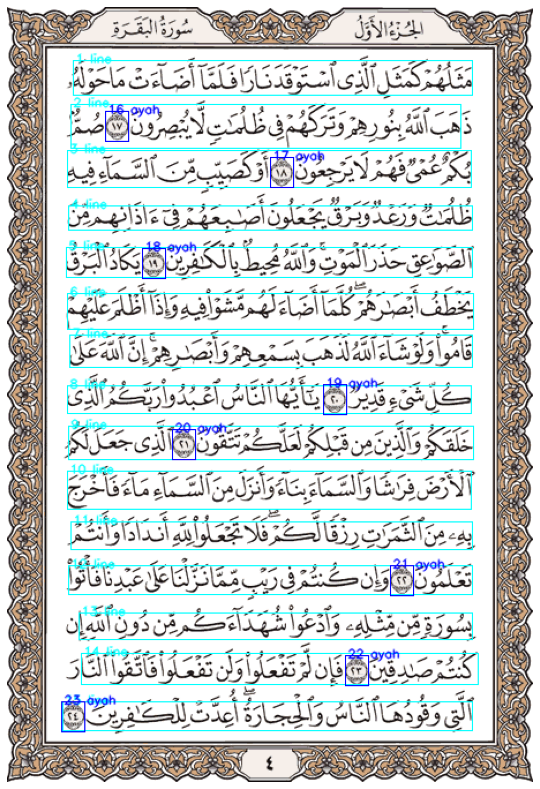

In [26]:
# Gather all bboxes
bbox_all_lines = [bbox for bbox in bbox_ids if bbox["LABEL"] != "ayah"] + bbox_lines_
bbox_all_lines.sort(key=lambda x: x["TOP_LEFT_Y"])

bbox_ayah = [bbox for bbox in bbox_ids if bbox["LABEL"] == "ayah"]
bbox_ayah.sort(key=lambda x: x["TOP_LEFT_Y"])

bbox_all = bbox_all_lines + bbox_ayah
image_before_norm = image.copy()
for idx, bbox in enumerate(bbox_all):
    cv2.rectangle(
        image_before_norm,
        (bbox["TOP_LEFT_X"], bbox["TOP_LEFT_Y"]),
        (bbox["BOTTOM_RIGHT_X"], bbox["BOTTOM_RIGHT_Y"]),
        bbox["COLOR"],
        1,
    )
    cv2.putText(
        image_before_norm,
        f"{idx + 1} {bbox['LABEL']}",
        (bbox["TOP_LEFT_X"] + 2, bbox["TOP_LEFT_Y"] + 2),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.35,
        bbox["COLOR"],
        1,
        cv2.LINE_AA,
    )

plt.imshow(image_before_norm)
plt.show()

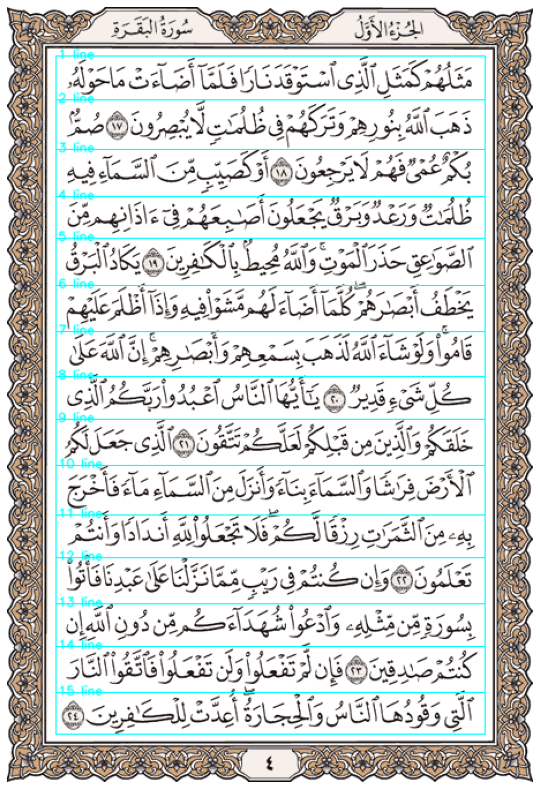

In [27]:
# Normalise
# to remove gap between bbox lines
bbox_all_lines_norm = bbox_all_lines.copy()
for idx_line, bbox in enumerate(bbox_all_lines_norm):
    try:
        y_center = int((bbox["BOTTOM_RIGHT_Y"] + bbox_all_lines_norm[idx_line + 1]["TOP_LEFT_Y"]) / 2)
        bbox_all_lines_norm[idx_line]["BOTTOM_RIGHT_Y"] = bbox_all_lines_norm[idx_line + 1]["TOP_LEFT_Y"] = y_center
    except:
        break

# to uniform bbox line lengths
for idx, _ in enumerate(bbox_all_lines_norm):
    bbox_all_lines_norm[idx]["TOP_LEFT_X"] = PAGE_BORDER
    bbox_all_lines_norm[idx]["BOTTOM_RIGHT_X"] = PAGE_WIDTH - PAGE_BORDER

# TODO: uniform line height for all `bbox[label=line]` only
bbox_all_lines_norm[0]["TOP_LEFT_Y"] = min(PAGE_BORDER, bbox_all_lines_norm[0]["TOP_LEFT_Y"])
bbox_all_lines_norm[-1]["BOTTOM_RIGHT_Y"] = max(PAGE_HEIGHT - PAGE_BORDER, bbox_all_lines_norm[-1]["BOTTOM_RIGHT_Y"])

image_after_norm = image.copy()
for idx, bbox in enumerate(bbox_all_lines_norm):
    cv2.rectangle(
        image_after_norm,
        (bbox["TOP_LEFT_X"], bbox["TOP_LEFT_Y"]),
        (bbox["BOTTOM_RIGHT_X"], bbox["BOTTOM_RIGHT_Y"]),
        bbox["COLOR"],
        1,
    )
    cv2.putText(
        image_after_norm,
        f"{idx + 1} {bbox['LABEL']}",
        (bbox["TOP_LEFT_X"] + 2, bbox["TOP_LEFT_Y"] + 2),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.35,
        bbox["COLOR"],
        1,
        cv2.LINE_AA,
    )

plt.imshow(image_after_norm)
plt.show()

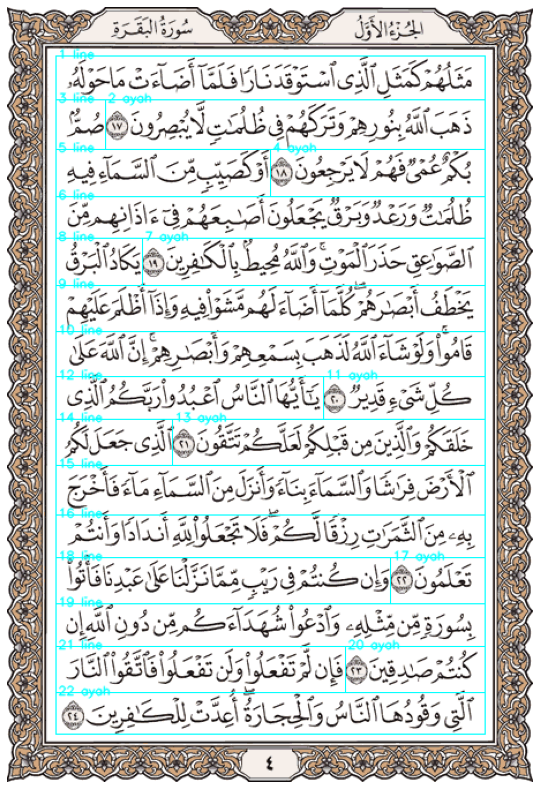

In [28]:
AYAH_MARGIN_TOLERANCE = PAGE_BORDER + 30

# Ayah segmentation
bboxes = []
idx_ayah = 0
for idx_line, bbox_line in enumerate(bbox_all_lines_norm):
    if bbox_line['LABEL'] != 'line':
        bboxes.append(bbox_line)
        continue

    def get_y_center(bbox):
        return bbox['TOP_LEFT_Y'] + (bbox['BOTTOM_RIGHT_Y'] - bbox['TOP_LEFT_Y']) / 2

    # Find all ayah's end marker for the current page line
    bbox_ayah_ = []
    if len(bbox_ayah) > 0:
        y_center = get_y_center(bbox_ayah[idx_ayah])
        while bbox_line['TOP_LEFT_Y'] < y_center < bbox_line['BOTTOM_RIGHT_Y']:
            bbox_ayah_.append(bbox_ayah[idx_ayah])
            idx_ayah += 1
            try:
                y_center = get_y_center(bbox_ayah[idx_ayah])
            except:
                break

    if len(bbox_ayah_) > 0:
        bbox_ayah_.sort(key=lambda x: x["TOP_LEFT_X"], reverse=True)
        margin_right = bbox_line['BOTTOM_RIGHT_X']
        for idx_ayah_, bbox in enumerate(bbox_ayah_):
            bbox_line_ = bbox_line.copy()
            bbox_line_['TOP_LEFT_X'] = bbox['TOP_LEFT_X']
            try:
                if bbox['TOP_LEFT_X'] < AYAH_MARGIN_TOLERANCE or (
                    (idx_ayah_ + 1) == len(bbox_ayah_) and
                    bbox_all_lines_norm[idx_line + 1]['LABEL'] != 'line'
                ):
                    bbox_line_['TOP_LEFT_X'] = bbox_line['TOP_LEFT_X']
            except:
                bbox_line_['TOP_LEFT_X'] = bbox_line['TOP_LEFT_X']
            bbox_line_['BOTTOM_RIGHT_X'] = margin_right
            bbox_line_['LABEL'] = bbox['LABEL']
            bboxes.append(bbox_line_)
            margin_right = bbox_line_['TOP_LEFT_X']

        if bbox_line_['TOP_LEFT_X'] > bbox_line['TOP_LEFT_X']:
            bbox_line__ = bbox_line.copy()
            bbox_line__['BOTTOM_RIGHT_X'] = bbox_line_['TOP_LEFT_X']
            bboxes.append(bbox_line__)
    else:
        bboxes.append(bbox_line)

image_ayah_segmented = image.copy()
for idx, bbox in enumerate(bboxes):
    cv2.rectangle(
        image_ayah_segmented,
        (bbox["TOP_LEFT_X"], bbox["TOP_LEFT_Y"]),
        (bbox["BOTTOM_RIGHT_X"], bbox["BOTTOM_RIGHT_Y"]),
        bbox["COLOR"],
        1,
    )
    cv2.putText(
        image_ayah_segmented,
        f"{idx + 1} {bbox['LABEL']}",
        (bbox["TOP_LEFT_X"] + 2, bbox["TOP_LEFT_Y"] + 2),
        cv2.FONT_HERSHEY_SIMPLEX,
        0.35,
        bbox["COLOR"],
        1,
        cv2.LINE_AA,
    )

plt.imshow(image_ayah_segmented)
plt.show()